# Robot Vision: Object Detection and Segmentation for Urban Navigation

This notebook demonstrates how modern computer vision models
can be applied to robotic perception tasks in urban environments.

The focus is on object detection and segmentation of
critical scene elements that influence navigation safety
for delivery and mobile robots.


In [ ]:
#@title Install Libraries

!pip install torch torchvision
!pip install -U git+https://github.com/luca-medeiros/lang-segment-anything.git



!pip install ultralytics

from IPython import display
display.clear_output()
import ultralytics
ultralytics.checks()
from ultralytics import YOLO

import moviepy
from moviepy.editor import *
from moviepy.editor import VideoFileClip
from IPython.display import display, clear_output, Image
import os
import gdown
import zipfile

from lang_sam import LangSAM

from PIL import Image as ImagePIL
import matplotlib.pyplot as plt
import cv2
import numpy as np
import glob

# YOLO =================================================

def load_video_i(url):
    output = "video.zip"

    # Проверяем, существует ли архив ves.zip
    if os.path.exists(output):
        # Если архив существует, удаляем его
        os.remove(output)

    # Скачиваем zip архив
    gdown.download(url, output, quiet=False)

    # Распаковываем архив в текущую директорию
    with zipfile.ZipFile(output, 'r') as zip_ref:
        zip_ref.extractall()


def load_weights(url):
    output = "ves.zip"

    # Проверяем, существует ли архив ves.zip
    if os.path.exists(output):
        # Если архив существует, удаляем его
        os.remove(output)

    # Скачиваем zip архив
    gdown.download(url, output, quiet=False)

    # Распаковываем архив в текущую директорию
    with zipfile.ZipFile(output, 'r') as zip_ref:
        zip_ref.extractall()

    print("\n Веса загружены!")


def load_dataset(url):

    output = "archive.zip"

    # Проверяем, существует ли архив archive.zip
    if os.path.exists(output):
        # Если архив существует, удаляем его
        os.remove(output)

    # Скачиваем zip архив
    gdown.download(url, output, quiet=False)

    # Распаковываем архив в текущую директорию
    with zipfile.ZipFile(output, 'r') as zip_ref:
        zip_ref.extractall()

    print("\n Датасет загружен!")


#люди и машины
def yolo_detect_person():
    !yolo task=detect mode=predict model=yolov8n.pt conf=0.6 source=/content/IMG_luki.mp4 save=True

#пешеходные переходы
def yolo_detect_perehod():
    !yolo task=detect mode=predict model=/content/best_perehod_segment.pt conf=0.2 source=/content/IMG_20231028_151652_597.mp4 save=True

#тротуары
def yolo_detect_trotuar():
    !yolo task=detect mode=predict model=/content/best_trotuar_500_150ep_m.pt conf=0.5 source=/content/IMG_20231028_150852_876.mp4 save=True


#тротуары
def yolo_detect_trotuar_asfalt():
    !yolo task=detect mode=predict model=/content/best_trotuar_500_150ep_m.pt conf=0.5 source=/content/IMG_20231028_013203_037.mp4 save=True


!pip install ultralytics

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

from IPython.display import display, Image

from ultralytics import YOLO



# SAM ===============================

!pip install torch torchvision
!pip install -U git+https://github.com/luca-medeiros/lang-segment-anything.git




model = LangSAM()

def segment_LangSAM(image_path, text_prompt, random_color=False):

    def display_results(image, masks, random_color):

        def show_mask(mask, ax, random_color):
            if random_color:
                color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
            else:
                color = np.array([30/255, 144/255, 255/255, 0.6])
            h, w = mask.shape[-2:]
            mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
            ax.imshow(mask_image)

        plt.figure(figsize=(16, 16))
        source_img_ax, segmented_img_ax = plt.subplot(1, 2, 1), plt.subplot(1, 2, 2)

        source_img_ax.set_title('Исходное изображение')
        source_img_ax.axis('off')
        source_img_ax.imshow(image)

        segmented_img_ax.set_title('Сегментированное изображение')
        segmented_img_ax.axis('off')
        segmented_img_ax.imshow(image)

        for mask in masks:
            show_mask(mask, plt.gca(), random_color)

    image_PIL = ImagePIL.open(image_path).convert("RGB")
    masks, boxes, phrases, logits = model.predict(image_PIL, text_prompt)

    image_bgr = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

    display_results(image_rgb, masks, random_color)

    return masks, boxes, phrases, logits


test_prompt = 'sidewalk.crosswalk.person.car.bus stop.bus.urn.pothole.address plate' # тротуар.переход.человек.автомобиль.автобусная остановка.автобус.урна.выбоина.адресная табличка

# sidewalk

!wget -q https://narodfm.ru/images/novosti/medium/cb10d9f5d6a57f582b37706624029ba4.jpg -O sidewalk_1.jpg
sidewalk_1_path = '/content/sidewalk_1.jpg'

!wget -q https://img3.teletype.in/files/2f/12/2f1297cb-bd1d-48b4-940d-5ae47ebbe3b3.jpeg -O sidewalk_2.jpg
sidewalk_2_path = '/content/sidewalk_2.jpg'

!wget -q https://vr-vyksa.ru/media/images/DSC_0797_RuFxVFe.width-1600.watermark-lb-10x10-0.6.jpg -O sidewalk_3.jpg
sidewalk_3_path = '/content/sidewalk_3.jpg'

!wget -q https://upload.wikimedia.org/wikipedia/commons/6/60/Sidewalk_with_bike_path.JPG -O sidewalk_4.jpg
sidewalk_4_path = '/content/sidewalk_4.jpg'

!wget -q https://st1.stpulscen.ru/images/product/040/380/958_medium2.jpg -O sidewalk_5.jpg
sidewalk_5_path = '/content/sidewalk_5.jpg'

sidewalk = [sidewalk_1_path, sidewalk_2_path, sidewalk_3_path, sidewalk_4_path, sidewalk_5_path]

# crosswalk

!wget -q https://www.shadr.info/news/2020/05/03/17023-img-ylo5kh-680x453.jpg -O crosswalk_1.jpg
crosswalk_1_path = '/content/crosswalk_1.jpg'

!wget -q https://s0.rbk.ru/v6_top_pics/media/img/2/17/756368150320172.jpg -O crosswalk_2.jpg
crosswalk_2_path = '/content/crosswalk_2.jpg'

!wget -q https://www.avtovzglyad.ru/media/article/0_Hv9w5tB.jpg.740x555_q85_box-0%2C0%2C980%2C735_crop_detail_upscale.jpg -O crosswalk_3.jpg
crosswalk_3_path = '/content/crosswalk_3.jpg'

!wget -q https://vlpravda.ru/wp-content/uploads/2022/04/99_full-735x400.jpg -O crosswalk_4.jpg
crosswalk_4_path = '/content/crosswalk_4.jpg'


crosswalk = [crosswalk_1_path, crosswalk_2_path, crosswalk_3_path, crosswalk_4_path]

# person

!wget -q https://s0.rbk.ru/v6_top_pics/media/img/1/66/756401567970661.jpg -O person_1.jpg
person_1_path = '/content/person_1.jpg'

!wget -q https://ss.sport-express.ru/userfiles/materials/169/1696394/volga.jpg -O person_2.jpg
person_2_path = '/content/person_2.jpg'

!wget -q https://admnvrsk.ru/upload/resize_cache/iblock/47b/865_497_2/euyeqnevrqlv01177vxvbzk2kxco87ee.jpg -O person_3.jpg
person_3_path = '/content/person_3.jpg'

!wget -q https://riamo.ru/files/image/04/63/76/gallery!6n7.png -O person_4.jpg
person_4_path = '/content/person_4.jpg'

person = [person_1_path, person_2_path, person_3_path, person_4_path]

# car

!wget -q https://sanantonioreport.org/wp-content/uploads/2022/03/nickwagner-pedestrians-sidewalk-san-pedro-ave-09MAR22-2.jpg -O car_1.jpg
car_1_path = '/content/car_1.jpg'

!wget -q https://assets.bwbx.io/images/users/iqjWHBFdfxIU/iPrDvyGApPiI/v1/1200x1202.jpg -O car_2.jpg
car_2_path = '/content/car_2.jpg'

!wget -q https://newyorkparkingticket.com/wp-content/uploads/2019/12/Myrna-NYC-sidewalk-parking-ticket2.jpeg -O car_3.jpg
car_3_path = '/content/car_3.jpg'

!wget -q https://nacto.org/wp-content/themes/sink_nacto/views/design-guides/retrofit/urban-street-design-guide/images/sidewalks/carousel//retail-sidewalk.jpg -O car_4.jpg
car_4_path = '/content/car_4.jpg'


car = [car_1_path, car_2_path, car_3_path, car_4_path]

# bus_stop

!wget -q https://test.merdi.ru/upload/userfiles/22092020/images/f154836a13f1d413ed1d81bc1e43cc46.jpg -O bus_stop_1.jpg
bus_stop_1_path = '/content/bus_stop_1.jpg'

!wget -q https://static.tildacdn.com/tild3162-6635-4530-a438-663462613038/atw1e8ej6ee.jpg -O bus_stop_2.jpg
bus_stop_2_path = '/content/bus_stop_2.jpg'

!wget -q https://i.ytimg.com/vi/8ebqyFMxVE4/maxresdefault.jpg -O bus_stop_3.jpg
bus_stop_3_path = '/content/bus_stop_3.jpg'

!wget -q https://www.oknamedia.ru/system/uploads/photo/photo/484/48415/wallpaper_Screenshot_1.jpg -O bus_stop_4.jpg
bus_stop_4_path = '/content/bus_stop_4.jpg'

bus_stop = [bus_stop_1_path, bus_stop_2_path, bus_stop_3_path, bus_stop_4_path]

# bus

!wget -q https://upload.wikimedia.org/wikipedia/commons/0/03/LiAZ-5292_Ryazan.jpg -O bus_1.jpg
bus_1_path = '/content/bus_1.jpg'

!wget -q https://arbuztoday.ru/wp-content/uploads/2022/12/2022-12-18-12-12-34.jpg -O bus_2.jpg
bus_2_path = '/content/bus_2.jpg'

!wget -q https://msknovosti.ru/wp-content/uploads/2021/11/img_0768-870x400.jpg -O bus_3.jpg
bus_3_path = '/content/bus_3.jpg'

!wget -q https://cdn.iportal.ru/news/2015/99/preview/aa9ea7e236411206416b005445248d8b08b363e3_2048_1365_c.jpg -O bus_4.jpg
bus_4_path = '/content/bus_4.jpg'

bus = [bus_1_path, bus_2_path, bus_3_path, bus_4_path]


# urn

!wget -q https://riamo.ru/files/image/14/95/61/-gallery!0d4n.jpeg -O urn_1.jpg
urn_1_path = '/content/urn_1.jpg'

!wget -q https://gorodmaf.ru/wp-content/uploads/2023/06/zhhzhzhzhz.jpg -O urn_2.jpg
urn_2_path = '/content/urn_2.jpg'

!wget -q https://hozotdel.ru/wa-data/public/shop/products/07/48/4807/images/19798/19798.970.jpg -O urn_3.jpg
urn_3_path = '/content/urn_3.jpg'

!wget -q https://italianet23.ru/wp-content/uploads/2020/10/urna-dlya-musora-kil-04.jpg -O urn_4.jpg
urn_4_path = '/content/urn_4.jpg'


urn = [urn_1_path, urn_2_path, urn_3_path, urn_4_path]


# pothole

!wget -q http://www.razruha.org/data/media/55/1497131081e8b.jpg -O pothole_1.jpg
pothole_1_path = '/content/pothole_1.jpg'

!wget -q http://www.razruha.org/data/media/55/16607260462f8.jpg -O pothole_2.jpg
pothole_2_path = '/content/pothole_2.jpg'

!wget -q https://24.kg/files/media/267/267981.JPG -O pothole_3.jpg
pothole_3_path = '/content/pothole_3.jpg'

!wget -q https://pravdapfo.ru/sites/default/files/0_83411_a35b8b06_xl.jpg -O pothole_4.jpg
pothole_4_path = '/content/pothole_4.jpg'


pothole = [pothole_1_path, pothole_2_path, pothole_3_path, pothole_4_path]

# address_plate

!wget -q https://ugra.ru/pics-newtambov.ru/storage/taisia/2016/02/IMG_7050.jpg -O address_plate_1.jpg
address_plate_1_path = '/content/address_plate_1.jpg'

!wget -q https://foto.cheb.ru/foto/foto.cheb.ru-254664.jpg -O address_plate_2.jpg
address_plate_2_path = '/content/address_plate_2.jpg'

!wget -q https://upload.cheb.ru/uploads/397716/PkB61tY5ciN2F8f4y2yX8A==/fullview/img_8943.jpg -O address_plate_3.jpg
address_plate_3_path = '/content/address_plate_3.jpg'

!wget -q https://foto.cheb.ru/foto/foto.cheb.ru-252159.jpg -O address_plate_4.jpg
address_plate_4_path = '/content/address_plate_4.jpg'


address_plate = [address_plate_1_path, address_plate_2_path, address_plate_3_path, address_plate_4_path]





Ultralytics YOLOv8.0.203 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 27.4/78.2 GB disk)


  Cloning https://github.com/luca-medeiros/lang-segment-anything.git to /tmp/pip-req-build-hestqeqi
  Running command git clone --filter=blob:none --quiet https://github.com/luca-medeiros/lang-segment-anything.git /tmp/pip-req-build-hestqeqi
  Resolved https://github.com/luca-medeiros/lang-segment-anything.git to commit e6b339b84b22e8dbf05c9d51a7b232a505fe5a16
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Cloning https://github.com/IDEA-Research/GroundingDINO.git to /tmp/pip-install-jm8wz1u6/groundingdino_b764d01aebc74ad5b642db53015c119a
  Running command git clone --filter=blob:none --quiet https://github.com/IDEA-Research/GroundingDINO.git /tmp/pip-install-jm8wz1u6/groundingdino_b764d01aebc74ad5b642db53015c119a
  Resolved https://github.com/IDEA-Research/GroundingDINO.git to commit 60d796825e1266e56f7e4e9e00e88de662b67bd3
  Preparing metadata (setup.py) ... done
  Cloning https://github.com/fac

  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]



final text_encoder_type: bert-base-uncased


Model loaded from /root/.cache/huggingface/hub/models--ShilongLiu--GroundingDINO/snapshots/a94c9b567a2a374598f05c584e96798a170c56fb/groundingdino_swinb_cogcoor.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])


Downloading: "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth" to /root/.cache/torch/hub/checkpoints/sam_vit_h_4b8939.pth
100%|██████████| 2.39G/2.39G [00:11<00:00, 232MB/s]


For a delivery robot, objects in the environment can be divided into
**forbidden** and **allowed** categories.

Forbidden objects are those the robot must avoid interacting with,
such as people, cars, potholes, manholes, benches, trash bins,
bus stops, and other urban obstacles.

Allowed objects represent areas where robot movement is permitted,
for example sidewalks and pedestrian crossings.




For detecting people and vehicles, it is sufficient to use the YOLOv8 model,
which is pretrained to recognize these object categories out of the box.


## Object Detection: People and Vehicles

In this section, YOLOv8 is used to perform object detection on video data.
The model identifies people and vehicles, which are considered
high-risk obstacles for robotic navigation.


In [ ]:
# Загрука видео
url = "https://drive.google.com/uc?id=1DYJK21SbXe04wwgKIhQihEEvoHVJ5G_V" # ссылка на видео
load_video_i(url)

# Детектирование
yolo_detect_person()

Downloading...
From: https://drive.google.com/uc?id=1DYJK21SbXe04wwgKIhQihEEvoHVJ5G_V
To: /content/video.zip
100%|██████████| 6.65M/6.65M [00:00<00:00, 37.5MB/s]


100% 6.23M/6.23M [00:00<00:00, 108MB/s]
Ultralytics YOLOv8.0.202 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients, 8.7 GFLOPs

video 1/1 (1/751) /content/IMG_luki.mp4: 384x640 1 person, 158.5ms
video 1/1 (2/751) /content/IMG_luki.mp4: 384x640 1 person, 2 cars, 1 bus, 11.4ms
video 1/1 (3/751) /content/IMG_luki.mp4: 384x640 1 person, 3 cars, 10.8ms
video 1/1 (4/751) /content/IMG_luki.mp4: 384x640 1 person, 1 car, 10.5ms
video 1/1 (5/751) /content/IMG_luki.mp4: 384x640 1 person, 12.4ms
video 1/1 (6/751) /content/IMG_luki.mp4: 384x640 1 person, 17.1ms
video 1/1 (7/751) /content/IMG_luki.mp4: 384x640 (no detections), 17.1ms
video 1/1 (8/751) /content/IMG_luki.mp4: 384x640 1 car, 11.2ms
video 1/1 (9/751) /content/IMG_luki.mp4: 384x640 1 person, 1 car, 11.1ms
video 1/1 (10/751) /content/IMG_luki.mp4: 384x640 1 car, 10.8ms
video 1/1 (11/751) /content/IMG_luki.mp4: 384x640 (no detections), 11.2ms
video 1/1 (12/75

Results

<div align="center">
  <img
    width="700"
    src="https://storage.yandexcloud.net/aiueducation/marketing/datasets/robot/person_700_10fps.gif"
  >
</div>

*Note: You can download the video from the address specified at the end of the detection process in the folder `runs/...`*

> **We confirmed that YOLOv8 recognizes people and cars by default, but does not detect, for example, sidewalks and pedestrian crossings.
To ensure the delivery robot safely reaches its destination, YOLOv8 needs to be further trained on a custom (our) dataset. Text in bold**

> **Let's see how this can be done for a sidewalk and a pedestrian crossing.**

#Pedestrian Crossings (Segmentation)

**Dataset**
> The dataset contains 550 polygon-labeled images. Taken from the roboflow website:
 https://universe.roboflow.com/khiem-mye7k/crosswalk-99p0d/dataset/2

<div align="center">
  <img
    width="1000"
    src="https://storage.yandexcloud.net/aiueducation/marketing/datasets/robot/ris_zebra.png"
  >
</div>

Further training of YOLOv8s-seg (segmentation) on a custom dataset: pedestrian crossings.



In [ ]:
# Загрузка датасета
url = "https://drive.google.com/uc?id=1F0WmiEpHAguQyKAEZwwduRO3y9RiJst-" # датасет пешеходный переход (сегментация)
load_dataset(url)

# Дообучение
model = YOLO('yolov8s-seg.pt')
results = model.train(data="/content/pehehodnik_2/data.yaml", epochs=50)

100%|██████████| 22.8M/22.8M [00:00<00:00, 166MB/s]
Ultralytics YOLOv8.0.202 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolov8s-seg.pt, data=/content/pehehodnik_2/data.yaml, epochs=50, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina

*Note: training results, including loss curves and evaluation metrics,
are saved in the `runs/` directory and displayed at the end of the training process.
*

Training

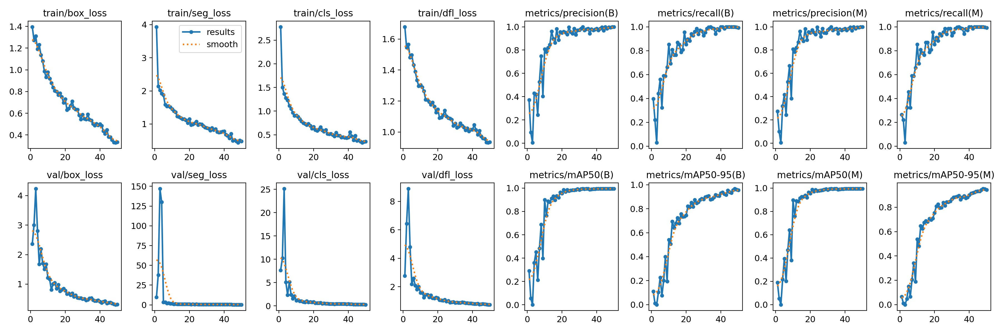

In [ ]:
Image(filename=f'/content/runs/segment/train2/results.png', width=1000)

*⚠️ **Important**

If you have completed model training, restart the runtime
before executing the next cell.
Otherwise, runtime conflicts or unexpected errors may occur.
:*

<div align="left">
  <img
    width="500"
    src="https://storage.yandexcloud.net/aiueducation/marketing/datasets/robot/ris.png"
  >
</div>



> **Let's see how our retrained model detects pedestrian crossings.**


Pedestrian Crossing Detection (Segmentation)

In [ ]:
# Загрузка видео для детектирования
url = "https://drive.google.com/uc?id=1-kACd-pNz6EuhJVMfEK5MnT306z5jGj9" # ссылка на видео
load_video_i(url)

# Загрузка весов дообученной на пешеходных переходах модели YOLOv8s
url = "https://drive.google.com/uc?id=1yEIXZXACDICHo4jmNablT89JYoiXIu2k" # ссылка на предобученную модель
load_weights(url)

# Детектирование
yolo_detect_perehod()

Downloading...
From: https://drive.google.com/uc?id=1-kACd-pNz6EuhJVMfEK5MnT306z5jGj9
To: /content/video.zip
100%|██████████| 10.8M/10.8M [00:00<00:00, 19.8MB/s]
Downloading...
From: https://drive.google.com/uc?id=1yEIXZXACDICHo4jmNablT89JYoiXIu2k
To: /content/ves.zip
100%|██████████| 21.9M/21.9M [00:00<00:00, 128MB/s] 



 Веса загружены!
WARNING ⚠️ conflicting 'task=detect' passed with 'task=segment' model. Ignoring 'task=detect' and updating to 'task=segment' to match model.
Ultralytics YOLOv8.0.202 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s-seg summary (fused): 195 layers, 11779987 parameters, 0 gradients, 42.4 GFLOPs

video 1/1 (1/270) /content/IMG_20231028_151652_597.mp4: 384x640 1 crosswalk, 95.6ms
video 1/1 (2/270) /content/IMG_20231028_151652_597.mp4: 384x640 1 crosswalk, 14.3ms
video 1/1 (3/270) /content/IMG_20231028_151652_597.mp4: 384x640 1 crosswalk, 22.4ms
video 1/1 (4/270) /content/IMG_20231028_151652_597.mp4: 384x640 1 crosswalk, 19.6ms
video 1/1 (5/270) /content/IMG_20231028_151652_597.mp4: 384x640 1 crosswalk, 14.2ms
video 1/1 (6/270) /content/IMG_20231028_151652_597.mp4: 384x640 1 crosswalk, 23.9ms
video 1/1 (7/270) /content/IMG_20231028_151652_597.mp4: 384x640 1 crosswalk, 36.7ms
video 1/1 (8/270) /content/IMG_20231028_151652_597.mp4: 384x640 1 crosswalk, 

Результат

<div align="center">
  <img
    width="700"
    src="https://storage.yandexcloud.net/aiueducation/marketing/datasets/robot/pp_700_10fps.gif"
  >
</div>

*Note: You can download the video from the address specified at the end of the detection process in the runs/... folder.`*

> **Now let's teach YOLOv8 to detect sidewalks.**

## Sidewalk Segmentation

In this section, semantic segmentation is used to identify sidewalks
as navigable areas for the robot.


**Dataset**
> The dataset contains 510 polygon-labeled images. Taken from the roboflow website:
https://universe.roboflow.com/capstone-project-nhlns/sidewalk-detection-ykwpf/dataset/8

<div align="center">
  <img
    width="1000"
    src="https://storage.yandexcloud.net/aiueducation/marketing/datasets/robot/ris_trot.png"
  >
</div>

Further training of YOLOv8m-seg (segmentation) on a custom dataset: sidewalks.


In [ ]:
# Загрузка датасета
url = "https://drive.google.com/uc?id=1YOf-pn503q2HZUuyoHYGm09quv0_8HWI" # датасет тротуар 500 (сегментация)
load_dataset(url)

# Дообучение
model = YOLO('yolov8m-seg.pt')
results = model.train(data="/content/trotuar_500/data.yaml", epochs=150)

100%|██████████| 52.4M/52.4M [00:00<00:00, 303MB/s]
Ultralytics YOLOv8.0.202 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolov8m-seg.pt, data=/content/trotuar_500/data.yaml, epochs=150, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_

Note: training results, including loss curves and evaluation metrics,
are saved in the `runs/` directory and displayed at the end of the training process.


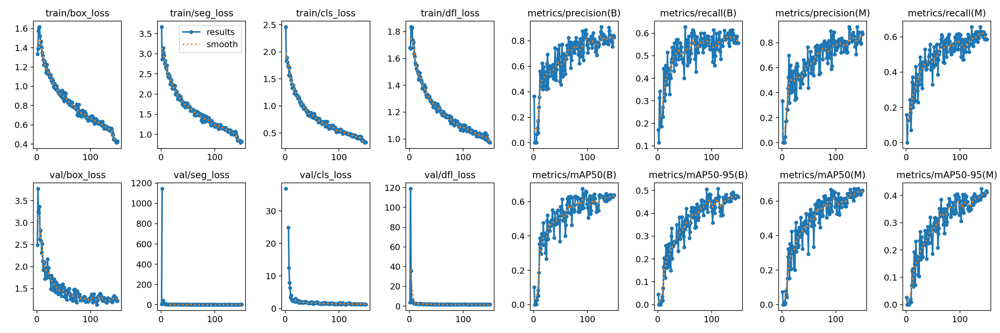

In [ ]:
Image(filename=f'/content/runs/segment/train/results.png', width=1000)

*⚠️ **Important**

If you have completed model training, restart the runtime
before executing the next cell.
Otherwise, runtime conflicts or unexpected errors may occur.
:*

<div align="left">
  <img
    width="500"
    src="https://storage.yandexcloud.net/aiueducation/marketing/datasets/robot/ris.png"
  >
</div>




## Sidewalk Segmentation

In this section, semantic segmentation is used to identify sidewalks
as navigable areas for the robot.

In [ ]:
# Загрузка видео для детектирования
url = "https://drive.google.com/uc?id=1SOtXVto7hmABhrKuXO_YBrNCKvjhuDSJ" # ссылка на видео
load_video_i(url)

# Загрузка весов дообученной на тротуарах модели YOLOv8m
url = "https://drive.google.com/uc?id=16bDgUgDxwtVDkAZWQVLgWBMxS21lDhR6" # ссылка на предобученную модель
load_weights(url)

# Детектирование
yolo_detect_trotuar()

Downloading...
From: https://drive.google.com/uc?id=1SOtXVto7hmABhrKuXO_YBrNCKvjhuDSJ
To: /content/video.zip
100%|██████████| 5.46M/5.46M [00:00<00:00, 172MB/s]
Downloading...
From: https://drive.google.com/uc?id=16bDgUgDxwtVDkAZWQVLgWBMxS21lDhR6
To: /content/ves.zip
100%|██████████| 50.5M/50.5M [00:00<00:00, 70.9MB/s]



 Веса загружены!
WARNING ⚠️ conflicting 'task=detect' passed with 'task=segment' model. Ignoring 'task=detect' and updating to 'task=segment' to match model.
Ultralytics YOLOv8.0.203 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8m-seg summary (fused): 245 layers, 27222963 parameters, 0 gradients, 110.0 GFLOPs

video 1/1 (1/312) /content/IMG_20231028_150852_876.mp4: 480x640 (no detections), 95.0ms
video 1/1 (2/312) /content/IMG_20231028_150852_876.mp4: 480x640 (no detections), 34.9ms
video 1/1 (3/312) /content/IMG_20231028_150852_876.mp4: 480x640 (no detections), 34.9ms
video 1/1 (4/312) /content/IMG_20231028_150852_876.mp4: 480x640 (no detections), 34.8ms
video 1/1 (5/312) /content/IMG_20231028_150852_876.mp4: 480x640 (no detections), 27.2ms
video 1/1 (6/312) /content/IMG_20231028_150852_876.mp4: 480x640 (no detections), 27.2ms
video 1/1 (7/312) /content/IMG_20231028_150852_876.mp4: 480x640 (no detections), 27.2ms
video 1/1 (8/312) /content/IMG_20231028_150852_8

Result

<div align="center">
  <img
    width="700"
    src="https://storage.yandexcloud.net/aiueducation/marketing/datasets/robot/tr_700_10fps.gif"
  >
</div>

*Note: training results, including loss curves and evaluation metrics,
are saved in the `runs/` directory and displayed at the end of the training process.
*

Asphalt Sidewalk Detection (Segmentation)

In [ ]:
# Загрузка видео для детектирования
url = "https://drive.google.com/uc?id=1-kGKtI4MxTWVldIaJioOJtOXvCQsmBEp" # ссылка на видео
load_video_i(url)

# Детектирование
yolo_detect_trotuar_asfalt()

Downloading...
From: https://drive.google.com/uc?id=1-kGKtI4MxTWVldIaJioOJtOXvCQsmBEp
To: /content/video.zip
100%|██████████| 14.2M/14.2M [00:00<00:00, 38.9MB/s]


WARNING ⚠️ conflicting 'task=detect' passed with 'task=segment' model. Ignoring 'task=detect' and updating to 'task=segment' to match model.
Ultralytics YOLOv8.0.203 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8m-seg summary (fused): 245 layers, 27222963 parameters, 0 gradients, 110.0 GFLOPs

video 1/1 (1/930) /content/IMG_20231028_013203_037.mp4: 352x640 1 sidewalk, 145.1ms
video 1/1 (2/930) /content/IMG_20231028_013203_037.mp4: 352x640 1 sidewalk, 30.6ms
video 1/1 (3/930) /content/IMG_20231028_013203_037.mp4: 352x640 1 sidewalk, 30.5ms
video 1/1 (4/930) /content/IMG_20231028_013203_037.mp4: 352x640 1 sidewalk, 30.5ms
video 1/1 (5/930) /content/IMG_20231028_013203_037.mp4: 352x640 1 sidewalk, 26.0ms
video 1/1 (6/930) /content/IMG_20231028_013203_037.mp4: 352x640 1 sidewalk, 24.5ms
video 1/1 (7/930) /content/IMG_20231028_013203_037.mp4: 352x640 1 sidewalk, 24.5ms
video 1/1 (8/930) /content/IMG_20231028_013203_037.mp4: 352x640 1 sidewalk, 24.6ms
video 1/1 (9/930)

Result

<div align="center">
  <img
    width="700"
    src="https://storage.yandexcloud.net/aiueducation/marketing/datasets/robot/tr_asfalt_700_10fps.gif"
  >
</div>

*Note: You can download the video from the address specified at the end of the detection process in the folder `runs/...`*

> **Now we can detect sidewalks.**

> **To further train the YOLO model to detect objects it doesn't "know," we need labeled datasets for these objects. The labeling process is very labor-intensive. But there are tools that can significantly simplify this process. One of the most powerful is langSAM**

# langSAM

> langSAM consists of two libraries: Grounding Dino and SAM. Grounding Dino understands language prompts (words and phrases) and searches for objects in the image that match the prompt. It then extracts bounding boxes for them. SAM, in turn, extracts (segments) the mask of the object within the bounding box.

> We'll feed the langSAM model the prompts (words and phrases) of the objects whose masks we want to extract.

### Sidewalks

In [ ]:
test_prompt = 'sidewalk' # тротуар

  warnings.warn(

  warnings.warn(

  warnings.warn(



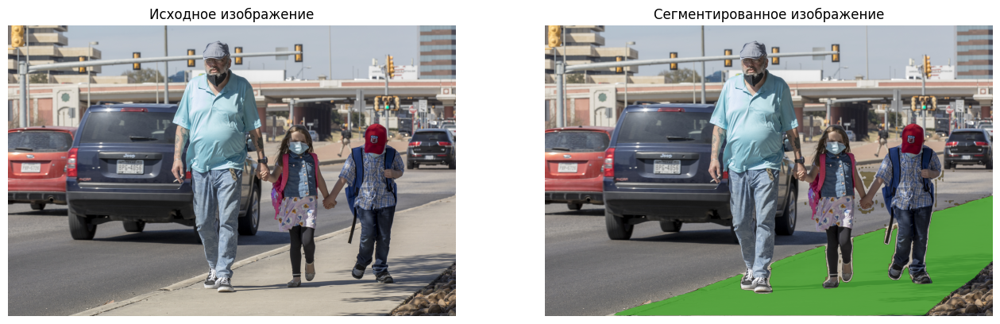

In [ ]:
masks, boxes, phrases, logits = segment_LangSAM(car[0], test_prompt, random_color=True)

### Crosswalk

In [ ]:
test_prompt = 'crosswalk' # переход

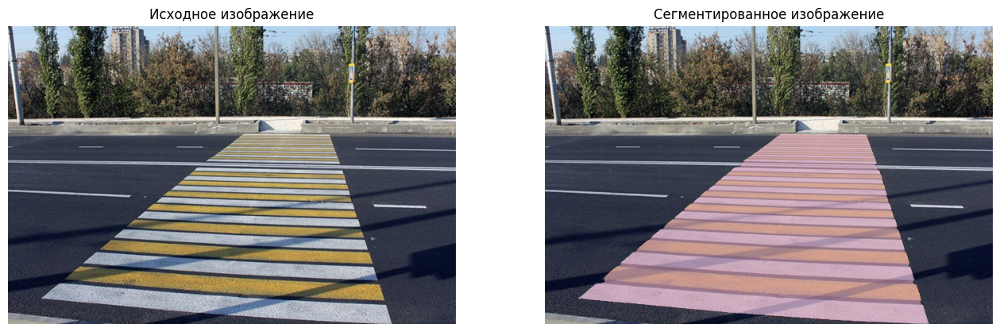

In [ ]:
masks, boxes, phrases, logits = \
segment_LangSAM(crosswalk[0], test_prompt, random_color=True)

In [ ]:
test_prompt = 'crosswalk' # переход

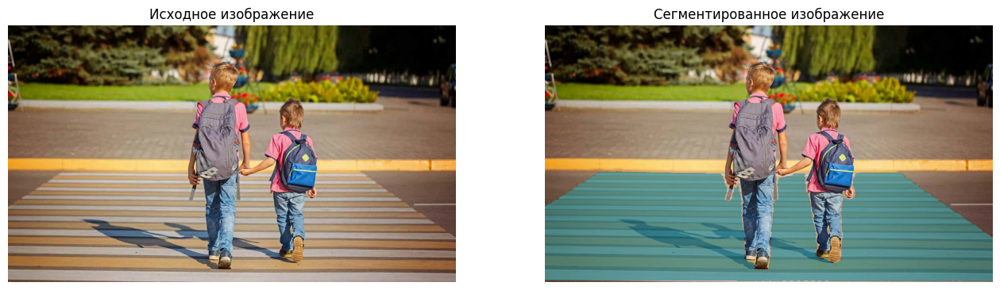

In [ ]:
masks, boxes, phrases, logits = \
segment_LangSAM(person[2], test_prompt, random_color=True)

### Obstacles

People

In [ ]:
test_prompt = 'person' # человек

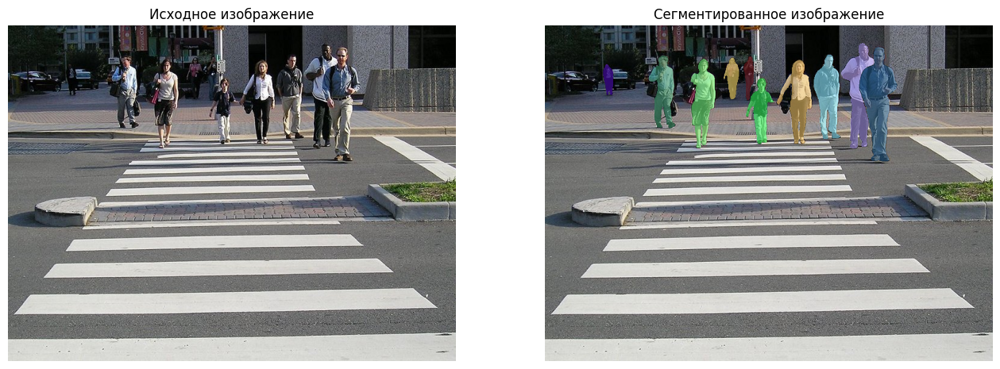

In [ ]:
masks, boxes, phrases, logits = \
segment_LangSAM(crosswalk[2], test_prompt, random_color=True)

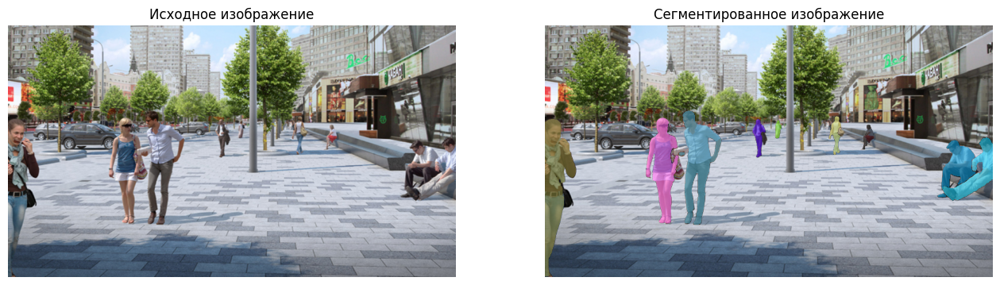

In [ ]:
masks, boxes, phrases, logits = \
segment_LangSAM(person[3], test_prompt, random_color=True)

Transport

In [ ]:
test_prompt = 'car' # автомобиль

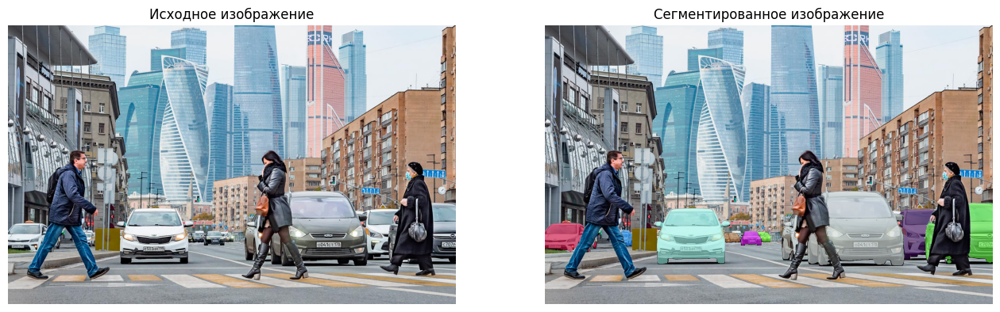

In [ ]:
masks, boxes, phrases, logits = \
segment_LangSAM(person[0], test_prompt, random_color=True)

In [ ]:
test_prompt = 'bus' #автобус

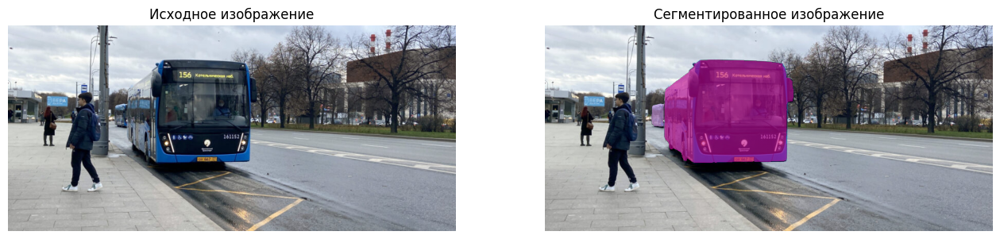

In [ ]:
masks, boxes, phrases, logits = \
segment_LangSAM(bus[2], test_prompt, random_color=True)

Bus stop

In [ ]:
test_prompt = 'bus stop' # автобусная остановка

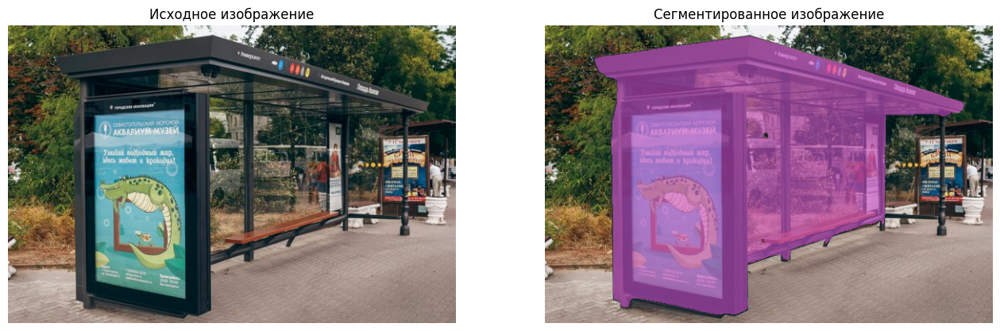

In [ ]:
masks, boxes, phrases, logits = \
segment_LangSAM(bus_stop[0], test_prompt, random_color=True)

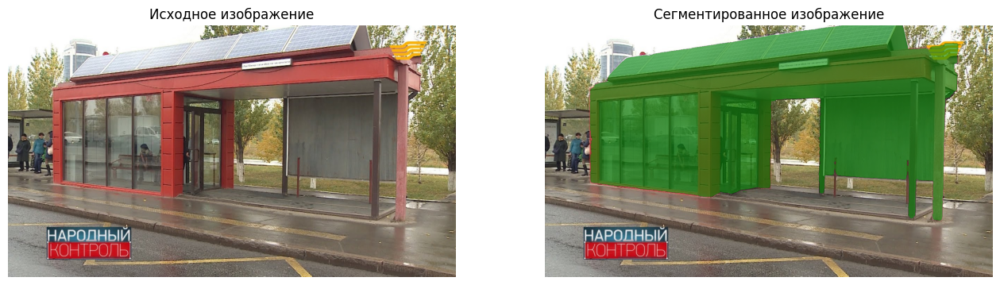

In [ ]:
masks, boxes, phrases, logits = \
segment_LangSAM(bus_stop[2], test_prompt, random_color=True)

Outdoor trashbin

In [ ]:
test_prompt = 'outdoor trash bin' # открытый мусорный бак

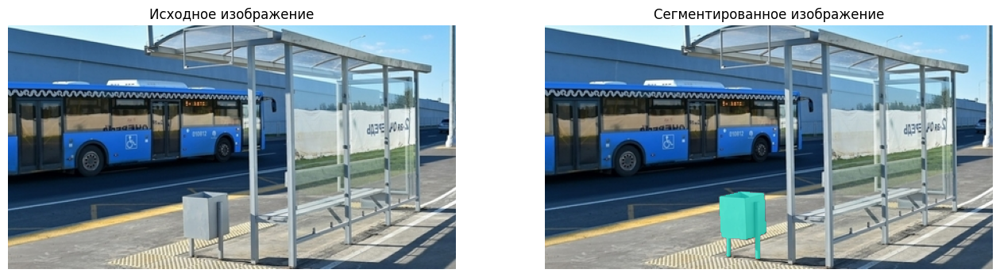

In [ ]:
masks, boxes, phrases, logits = \
segment_LangSAM(bus_stop[3], test_prompt, random_color=True)

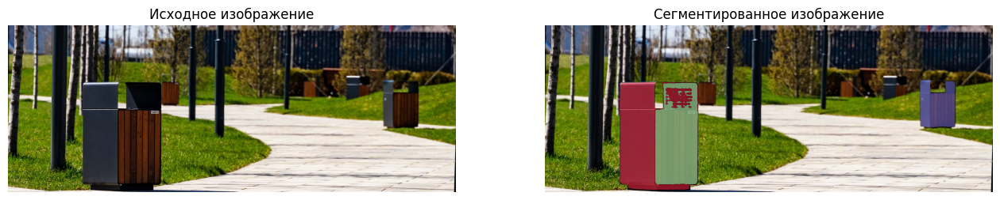

In [ ]:
masks, boxes, phrases, logits = \
segment_LangSAM(urn[1], test_prompt, random_color=True)

Bench

In [ ]:
test_prompt = 'bench' # скамейка

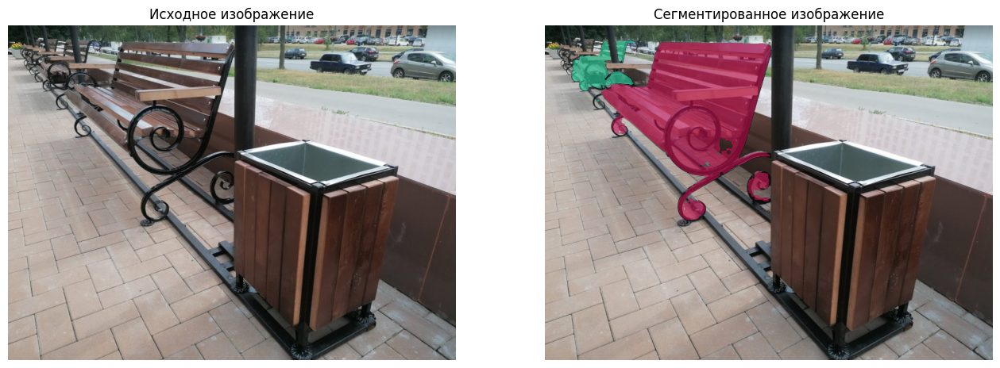

In [ ]:
masks, boxes, phrases, logits = \
segment_LangSAM(urn[2], test_prompt, random_color=True)

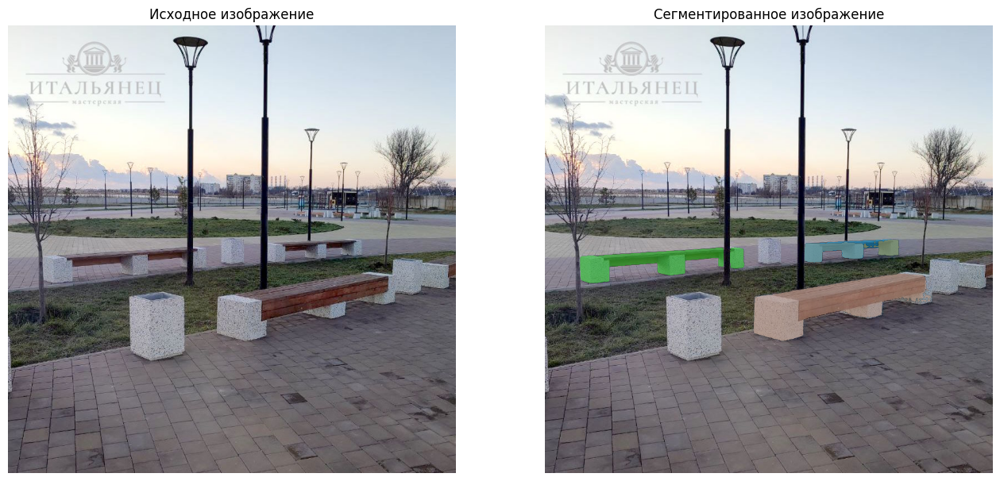

In [ ]:
masks, boxes, phrases, logits = \
segment_LangSAM(urn[3], test_prompt, random_color=True)

Pothole

In [ ]:
test_prompt = 'pothole' # выбоина

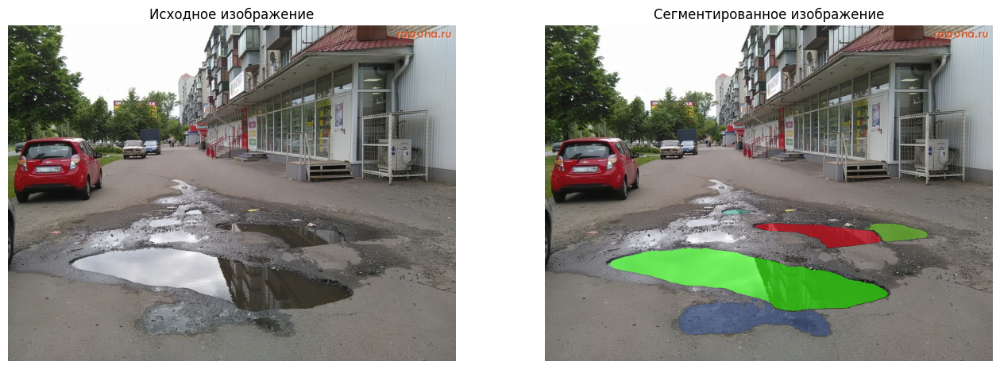

In [ ]:
masks, boxes, phrases, logits = \
segment_LangSAM(pothole[0], test_prompt, random_color=True)

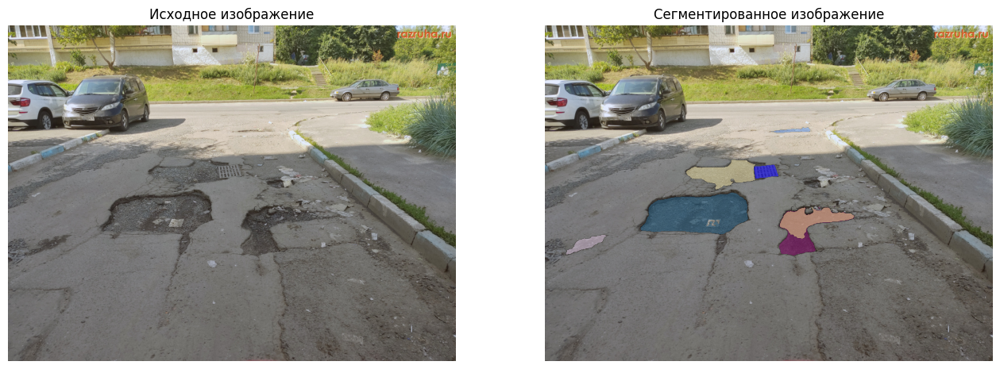

In [ ]:
masks, boxes, phrases, logits = \
segment_LangSAM(pothole[1], 'pothole', random_color=True)

### Address plate

In [ ]:
test_prompt = 'address plate' # адресная табличка

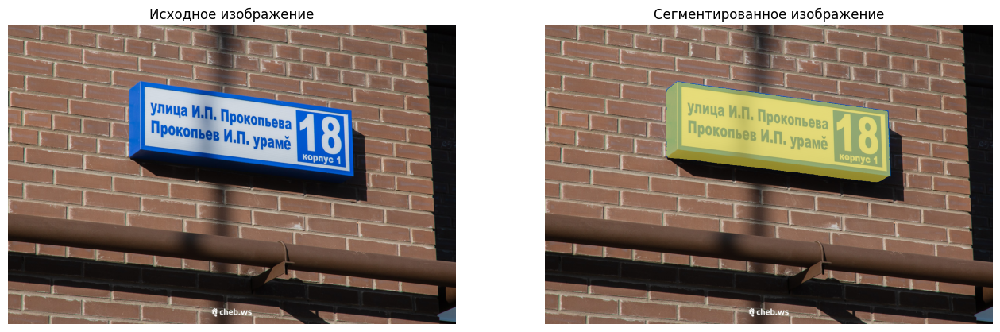

In [ ]:
masks, boxes, phrases, logits = \
segment_LangSAM(address_plate[2], test_prompt, random_color=True)

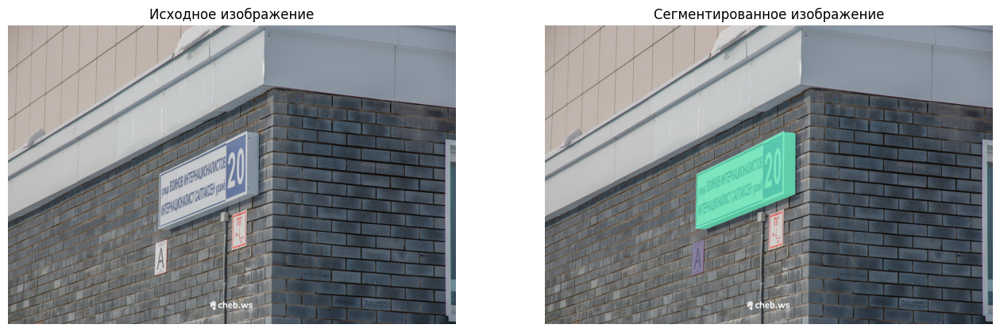

In [ ]:
masks, boxes, phrases, logits = \
segment_LangSAM(address_plate[3], test_prompt, random_color=True)

> **A delivery robot needs to know not only where it can move but also how to recognize street addresses. To do this, we'll train a YOLOv8 model that will initially detect street address signs.**

# Adress plates (ОД)

**Dataset**
> The dataset contains 1,000 images labeled with bouncing boxes. Taken from the roboflow website.:
https://universe.roboflow.com/vod11-yosi/tanda-jalan/dataset/1

<div align="center">
  <img
    width="800"
    src="https://storage.yandexcloud.net/aiueducation/marketing/datasets/robot/ris_tabl.png"
  >
</div>

Further training of YOLOv8n-seg (OD) on a custom dataset: address signs.



In [ ]:
# Загрузка датасета
url = "https://drive.google.com/uc?id=1tqTP25ASfpX_s9n9MBiF54P53aU-BOHb" # датасет табилчки с адресами (ОД)
load_dataset(url)

# Дообучение
model = YOLO('yolov8n.pt')
results = model.train(data="/content/datasets/data.yaml", epochs=100)

100%|██████████| 6.23M/6.23M [00:00<00:00, 184MB/s]
Ultralytics YOLOv8.0.201 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/datasets/data.yaml, epochs=100, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=Fa

*Note: You can find the training results (including graphs) in the `runs/...` folder. This information is displayed at the end of the training process!*

Trainig process

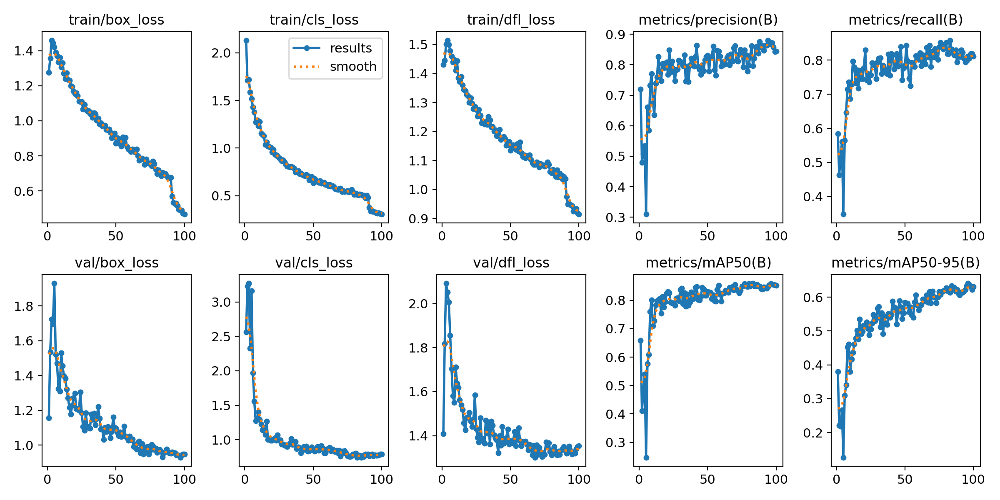

In [ ]:
Image(filename=f'/content/runs/detect/train/results.png', width=1000)

*⚠️ **Important**

If you have completed model training, restart the runtime
before executing the next cell.
Otherwise, runtime conflicts or unexpected errors may occur.
:*
<div align="left">
  <img
    width="500"
    src="https://storage.yandexcloud.net/aiueducation/marketing/datasets/robot/ris.png"
  >
</div>

In [ ]:
#@title OCR Libraries
import os
import gdown
import zipfile
from IPython.display import display, Image

def load_video_i(url):
    output = "video.zip"

    # Проверяем, существует ли архив ves.zip
    if os.path.exists(output):
        # Если архив существует, удаляем его
        os.remove(output)

    # Скачиваем zip архив
    gdown.download(url, output, quiet=False)

    # Распаковываем архив в текущую директорию
    with zipfile.ZipFile(output, 'r') as zip_ref:
        zip_ref.extractall()


def load_weights(url):
    output = "ves.zip"

    # Проверяем, существует ли архив ves.zip
    if os.path.exists(output):
        # Если архив существует, удаляем его
        os.remove(output)

    # Скачиваем zip архив
    gdown.download(url, output, quiet=False)

    # Распаковываем архив в текущую директорию
    with zipfile.ZipFile(output, 'r') as zip_ref:
        zip_ref.extractall()

    print("\n Веса загружены!")


def load_foto(url):

    output = "foto.zip"

    # Проверяем, существует ли архив foto.zip
    if os.path.exists(output):
        # Если архив существует, удаляем его
        os.remove(output)

    # Скачиваем zip архив
    gdown.download(url, output, quiet=False)

    # Распаковываем архив в текущую директорию
    with zipfile.ZipFile(output, 'r') as zip_ref:
        zip_ref.extractall()

    print("\n Фотографии загружены!")

#таблички
def yolo_detect_tablica():
    !yolo task=detect mode=predict model=/content/best_100.pt conf=0.8 source=/content/VID_20231026_195716_656.mp4 save=True

def yolo_detect_tablica_2():
    !yolo task=detect mode=predict model=/content/best_100.pt conf=0.8 source=/content/adres_1.MOV save=True

def yolo_detect_tablica_foto():
    !yolo task=detect mode=predict model=/content/best_100.pt conf=0.8 source=/content/tablihki/IMG_20231029_153654.jpg save=True
    !yolo task=detect mode=predict model=/content/best_100.pt conf=0.8 source=/content/tablihki/IMG_20231029_163221.jpg save=True
    !yolo task=detect mode=predict model=/content/best_100.pt conf=0.8 source=/content/tablihki/IMG_20231029_163120.jpg save=True


# OCR =========================================

# загружаем Tesseract
! apt install tesseract-ocr
! apt install libtesseract-dev
# Устанавливаем
!pip install pytesseract

# Импорт библиотек
import pytesseract
import matplotlib.pyplot as plt
import cv2
import glob
import os
import numpy as np

import cv2
from google.colab.patches import cv2_imshow

import gdown
import zipfile

# Загружаем данные для распознавания русского языка в нужную папку
!wget https://github.com/tesseract-ocr/tessdata/raw/4.00/rus.traineddata --directory-prefix=/usr/share/tesseract-ocr/4.00/tessdata/

# Установка переменной окружения
os.environ['TESSDATA_PREFIX'] = '/usr/share/tesseract-ocr/4.00/tessdata/'


!pip install ultralytics

# Загрузка файла весов по ссылке

url = "https://drive.google.com/uc?id=1eD9AOZIC9YCr8TfN3yRoMbbFNloW3m-R"
output = "ves.zip"

# Скачиваем zip архив
gdown.download(url, output, quiet=False)

# Распаковываем архив в текущую директорию
with zipfile.ZipFile(output, 'r') as zip_ref:
    zip_ref.extractall()

# Загрузка весов в модель
from ultralytics import YOLO
model = YOLO('/content/best_100.pt')


# Скачиваем zip архив
gdown.download("https://drive.google.com/uc?id=1Xjce5wd8v6UoX6JL4yLwb5lJ5rIT5boo", 'TestSamples.zip', quiet=False)


# Распаковываем архив в текущую директорию
!unzip -n "/content/TestSamples.zip" -d "/content/AdressSamples/"

Path = "/content/AdressSamples/TestSamples_2/"
File_Names = os.listdir(Path)
Full_List = []

for i, File in enumerate(File_Names):
  #print(i,':',File)
  Full_List.append(os.path.join(Path,File))

#print('')
Results = model.predict(source=Full_List, conf=0.6)


# Функция расшифровки данных предсказания
def give_box(results, n = 0, verbose = True):
  bboxes_ = results[n].boxes.xyxy.tolist()
  bboxes = list(map(lambda x: list(map(lambda y: int(y), x)), bboxes_))
  confs_ = results[n].boxes.conf.tolist()
  confs = list(map(lambda x: int(x*100), confs_))
  classes_ = results[n].boxes.cls.tolist()
  classes = list(map(lambda x: int(x), classes_))
  cls_dict = results[n].names
  class_names = list(map(lambda x: cls_dict[x], classes))
  if verbose:
    print('')

  return bboxes_


output_dir = '/content/Output'

if not os.path.exists(output_dir):
  os.mkdir(output_dir)

for i, File in enumerate(File_Names):

  # Загрузка изображения
  img = Results[i].orig_img
  bboxes = give_box(Results, i, False)

  # Создание bounding box
  for j in range(len(bboxes)):
    # Вывод результата в файл
    cv2.imwrite(os.path.join(output_dir,File_Names[i][:-4]+'_'+str(j)+'.png'), img[int(bboxes[j][1]):int(bboxes[j][3]),int(bboxes[j][0]):int(bboxes[j][2])])


def ocr_table():
    # С преобразованием в оттенки серого, нормализацией, инверсией цвета в случае преобладания черного фона, обрезанием рамки и списком разрешенных символов для tesseract
    for file_name in os.listdir(output_dir):

      # Загрузка изображения
      img = cv2.imread(os.path.join(output_dir,file_name))

      # Преобразование в оттенки серого
      grayscale = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

      norm_grayscale = np.zeros((img.shape[0], img.shape[1]))
      grayscale = cv2.normalize(grayscale, norm_grayscale, 0, 255, cv2.NORM_MINMAX)
      grayscale = cv2.threshold(grayscale, 150, 255, cv2.THRESH_BINARY)[1]

      # Вычисление величины кадрирования для анализа фона таблички
      b_crop_0 = int(grayscale.shape[0]*0.25)
      b_crop_1 = int(grayscale.shape[1]*0.25)

      #print('Среднее значение пикселей',np.mean(grayscale[b_crop_0:-b_crop_0,b_crop_1:-b_crop_1]))

      # Инверсия изображения если основной фон таблички темный
      if (np.mean(grayscale[b_crop_0:-b_crop_0,b_crop_1:-b_crop_1]) < 150):
        grayscale = cv2.bitwise_not(grayscale)

      # Вычисление величины кадрирования для анализа обрезания краев
      s_crop_0 = int(grayscale.shape[0]*0.1)
      s_crop_1 = int(grayscale.shape[1]*0.03)

      grayscale = grayscale[s_crop_0:-s_crop_0,s_crop_1:-s_crop_1]

      # Запуск распознавания Tesseract
      predicted_res = pytesseract.image_to_string(grayscale, lang = 'rus',
                                                  config = "--psm 6 --oem 0 -c tessedit_char_whitelist=.-0123456789ЙЦУКЕНГШЩЗХЪФЫВАПРОЛДЖЭЯЧСМИТЬБЮйцукенгшщзхъфывапролджэячсмитьбю")

      # Вывод изображения
      #cv2_imshow(grayscale)
      resized_img = cv2.resize(img, (600, int(img.shape[0] * (600 / img.shape[1]))))
      cv2_imshow(resized_img)
      # Вывод результата
      print(f'Для файла "{file_name}" результат распознавания:\n{predicted_res}')

    cv2.waitKey(0)
    cv2.destroyAllWindows()


def foto_predict():
  display(Image(filename=f'/content/runs/detect/predict2/IMG_20231029_153654.jpg', width=600))
  print()
  display(Image(filename=f'/content/runs/detect/predict3/IMG_20231029_163221.jpg', width=600))
  print()
  display(Image(filename=f'/content/runs/detect/predict4/IMG_20231029_163120.jpg', width=600))



Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 19 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 2s (2,863 kB/s)
Selecting previously unselected package tesseract-ocr-eng.
(Reading database ... 120874 files and directories currently installed.)
Preparing to unpack .../tesseract-ocr-

Downloading...
From: https://drive.google.com/uc?id=1eD9AOZIC9YCr8TfN3yRoMbbFNloW3m-R
To: /content/ves.zip
100%|██████████| 5.66M/5.66M [00:00<00:00, 96.3MB/s]
Downloading...
From: https://drive.google.com/uc?id=1Xjce5wd8v6UoX6JL4yLwb5lJ5rIT5boo
To: /content/TestSamples.zip
100%|██████████| 4.43M/4.43M [00:00<00:00, 129MB/s]

Archive:  /content/TestSamples.zip
   creating: /content/AdressSamples/TestSamples_2/
  inflating: /content/AdressSamples/TestSamples_2/Космонавтов проспект 4.jpg  
  inflating: /content/AdressSamples/TestSamples_2/Полевой пр-д 8а.jpg  
  inflating: /content/AdressSamples/TestSamples_2/ул ИСАЕВА 2А.jpg  
  inflating: /content/AdressSamples/TestSamples_2/ДЗЕРЖИНСКОГО улица 8А.jpg  
  inflating: /content/AdressSamples/TestSamples_2/им_гвардии_сержанта_Шумского_7а.jpg  




0: 640x640 1 tanda-jalan, 1: 640x640 1 tanda-jalan, 2: 640x640 1 tanda-jalan, 3: 640x640 1 tanda-jalan, 4: 640x640 2 tanda-jalans, 171.2ms
Speed: 13.5ms preprocess, 34.2ms inference, 9.1ms postprocess per image at shape (1, 3, 640, 640)


Address plate detection (OD)

In [ ]:
# Загрузка видео для детектирования
url = "https://drive.google.com/uc?id=1c_4NQxmzYw014rRMDZnq6mU-GBE4OOqS" # ссылка на видео
load_video_i(url)

# Загрузка весов дообученной на табличках с адресами модели YOLOv8s
url = "https://drive.google.com/uc?id=1eD9AOZIC9YCr8TfN3yRoMbbFNloW3m-R" # ссылка на предобученную модель
load_weights(url)

# Детектирование
yolo_detect_tablica()

Downloading...
From: https://drive.google.com/uc?id=1c_4NQxmzYw014rRMDZnq6mU-GBE4OOqS
To: /content/video.zip
100%|██████████| 2.35M/2.35M [00:00<00:00, 219MB/s]
Downloading...
From: https://drive.google.com/uc?id=1eD9AOZIC9YCr8TfN3yRoMbbFNloW3m-R
To: /content/ves.zip
100%|██████████| 5.66M/5.66M [00:00<00:00, 302MB/s]



 Веса загружены!
Ultralytics YOLOv8.0.203 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs

video 1/1 (1/277) /content/VID_20231026_195716_656.mp4: 384x640 (no detections), 99.0ms
video 1/1 (2/277) /content/VID_20231026_195716_656.mp4: 384x640 (no detections), 8.0ms
video 1/1 (3/277) /content/VID_20231026_195716_656.mp4: 384x640 (no detections), 6.2ms
video 1/1 (4/277) /content/VID_20231026_195716_656.mp4: 384x640 (no detections), 9.7ms
video 1/1 (5/277) /content/VID_20231026_195716_656.mp4: 384x640 (no detections), 6.0ms
video 1/1 (6/277) /content/VID_20231026_195716_656.mp4: 384x640 (no detections), 8.9ms
video 1/1 (7/277) /content/VID_20231026_195716_656.mp4: 384x640 (no detections), 6.9ms
video 1/1 (8/277) /content/VID_20231026_195716_656.mp4: 384x640 (no detections), 8.8ms
video 1/1 (9/277) /content/VID_20231026_195716_656.mp4: 384x640 (no detections), 7.5ms
video 1/1 (10/277) /content/VI

Result

<div align="center">
  <img
    width="700"
    src="https://storage.yandexcloud.net/aiueducation/marketing/datasets/robot/viveska_700_10fps.gif"
  >
</div>

In [ ]:
# Загрузка видео для детектирования
url = "https://drive.google.com/uc?id=1d0mUdXckAtErIlr9UYDL4mRisGJRL1Gm" # ссылка на видео
load_video_i(url)

# Детектирование
yolo_detect_tablica_2()

Downloading...
From: https://drive.google.com/uc?id=1d0mUdXckAtErIlr9UYDL4mRisGJRL1Gm
To: /content/video.zip
100%|██████████| 65.1M/65.1M [00:01<00:00, 62.0MB/s]


Ultralytics YOLOv8.0.203 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs

video 1/1 (1/321) /content/adres_1.MOV: 640x384 (no detections), 51.4ms
video 1/1 (2/321) /content/adres_1.MOV: 640x384 (no detections), 9.4ms
video 1/1 (3/321) /content/adres_1.MOV: 640x384 (no detections), 17.2ms
video 1/1 (4/321) /content/adres_1.MOV: 640x384 (no detections), 9.7ms
video 1/1 (5/321) /content/adres_1.MOV: 640x384 (no detections), 22.5ms
video 1/1 (6/321) /content/adres_1.MOV: 640x384 (no detections), 10.8ms
video 1/1 (7/321) /content/adres_1.MOV: 640x384 (no detections), 32.4ms
video 1/1 (8/321) /content/adres_1.MOV: 640x384 (no detections), 26.9ms
video 1/1 (9/321) /content/adres_1.MOV: 640x384 (no detections), 9.4ms
video 1/1 (10/321) /content/adres_1.MOV: 640x384 (no detections), 35.9ms
video 1/1 (11/321) /content/adres_1.MOV: 640x384 (no detections), 20.7ms
video 1/1 (12/321) /content/adres_1.MOV: 

Result

<div align="center">
  <img
    width="350"
    src="https://testkub.ru/ml/robot/viveska_2_400_10fps.gif"
  >
</div>

Detection of signs in frames (photographs)

In [ ]:
# Загрузка фото для детектирования
url = "https://drive.google.com/uc?id=1gztf04YjK7U23tH7lrpoM8iNhT1hAkB-" # ссылка на фото
load_foto(url)

# Детектирование
yolo_detect_tablica_foto()

Downloading...
From: https://drive.google.com/uc?id=1gztf04YjK7U23tH7lrpoM8iNhT1hAkB-
To: /content/foto.zip
100%|██████████| 3.24M/3.24M [00:00<00:00, 162MB/s]



 Фотографии загружены!
Ultralytics YOLOv8.0.203 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs

image 1/1 /content/tablihki/IMG_20231029_153654.jpg: 480x640 1 tanda-jalan, 107.6ms
Speed: 5.0ms preprocess, 107.6ms inference, 116.7ms postprocess per image at shape (1, 3, 480, 640)
Results saved to runs/detect/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict
Ultralytics YOLOv8.0.203 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs

image 1/1 /content/tablihki/IMG_20231029_163221.jpg: 480x640 1 tanda-jalan, 51.9ms
Speed: 3.6ms preprocess, 51.9ms inference, 77.4ms postprocess per image at shape (1, 3, 480, 640)
Results saved to runs/detect/predict3
💡 Learn more at https://docs.ultralytics.com/modes/predict
Ultralytics YOLOv8.0.203 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 151

Results

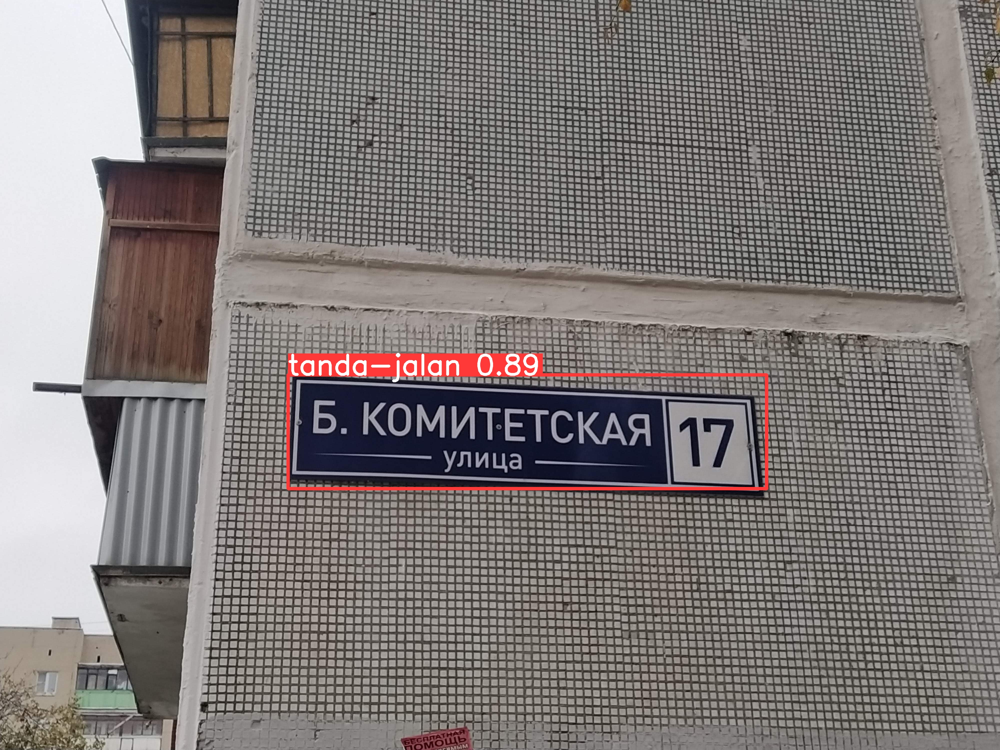

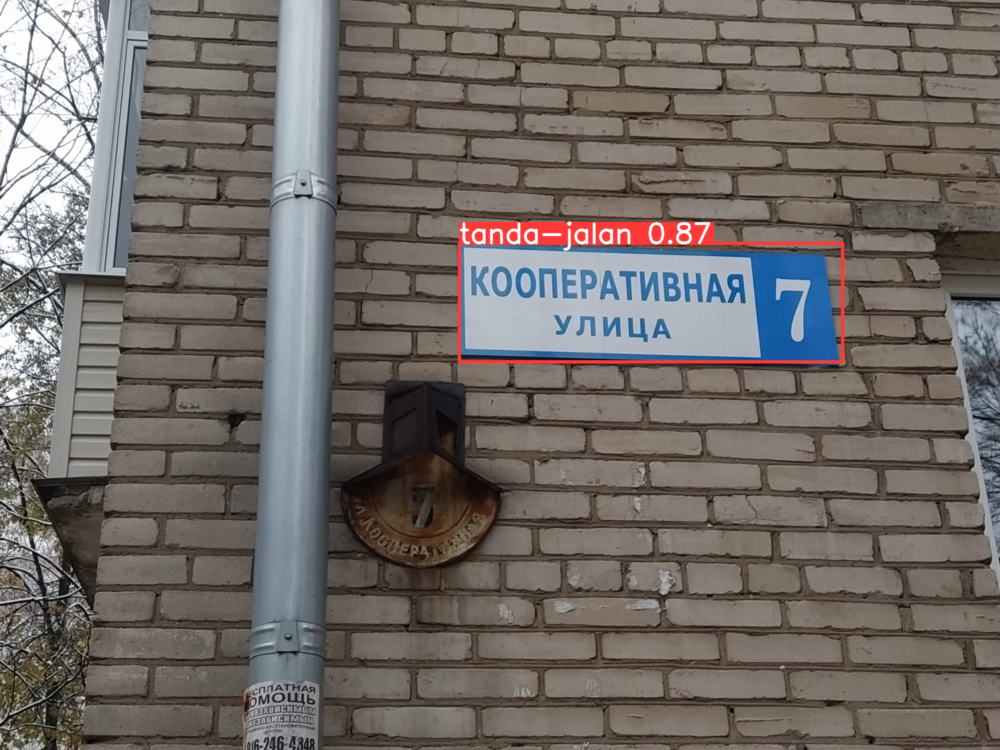

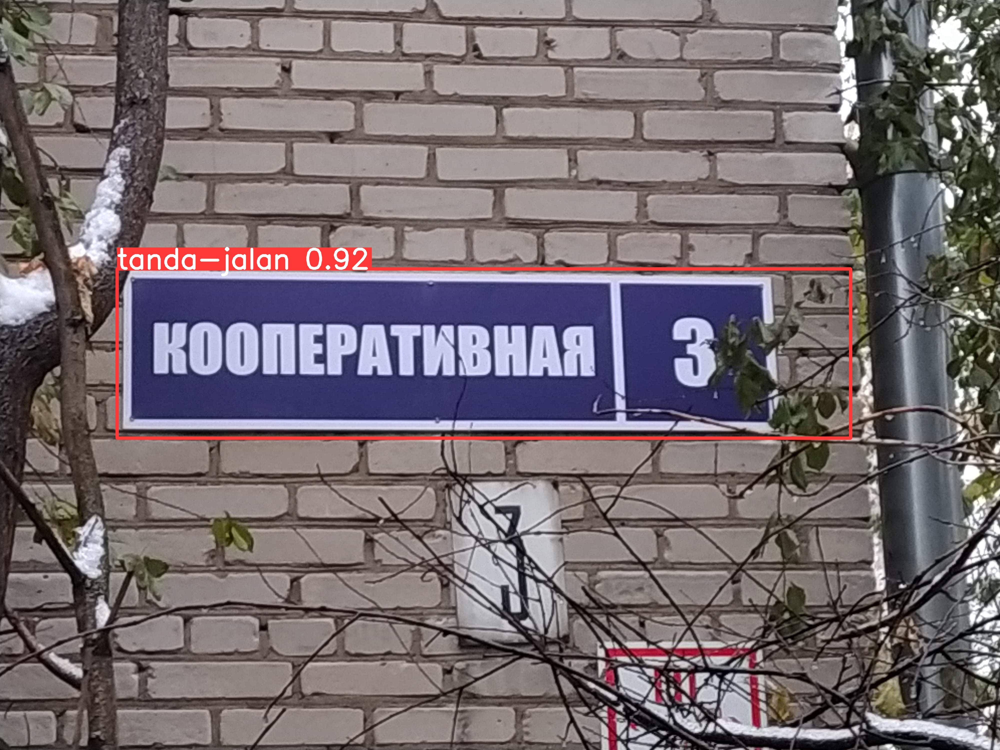

In [ ]:
foto_predict()

> **Our model can detect signs. Now all that's left is to recognize the information on the sign. For this, we'll use OCR.**

## OCR

>We will submit several signs for recognition

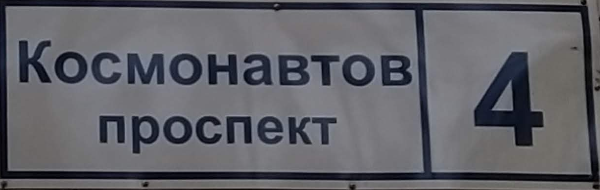

Для файла "Космонавтов проспект 4_0.png" результат распознавания:
Космонавтов 4 -
ПРОСПЭКТ



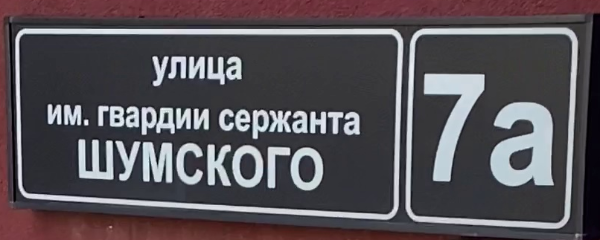

Для файла "им_гвардии_сержанта_Шумского_7а_0.png" результат распознавания:
улица
им. гвардии сержанта 7 а
ШУМСКОГО



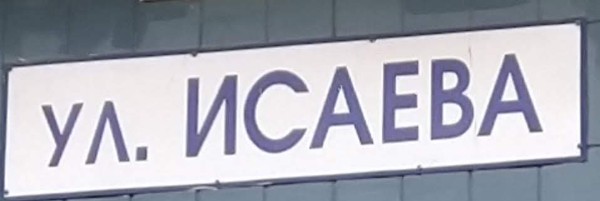

Для файла "ул ИСАЕВА 2А_0.png" результат распознавания:
УА. ИСАЕВА



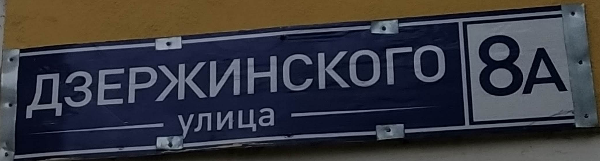

Для файла "ДЗЕРЖИНСКОГО улица 8А_0.png" результат распознавания:
ДЗЕРЖИНСКОГО в
жда-г.улица к



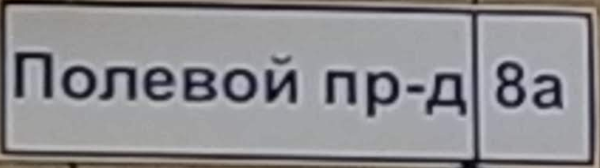

Для файла "Полевой пр-д 8а_0.png" результат распознавания:
Полевой пр-Ч 8а



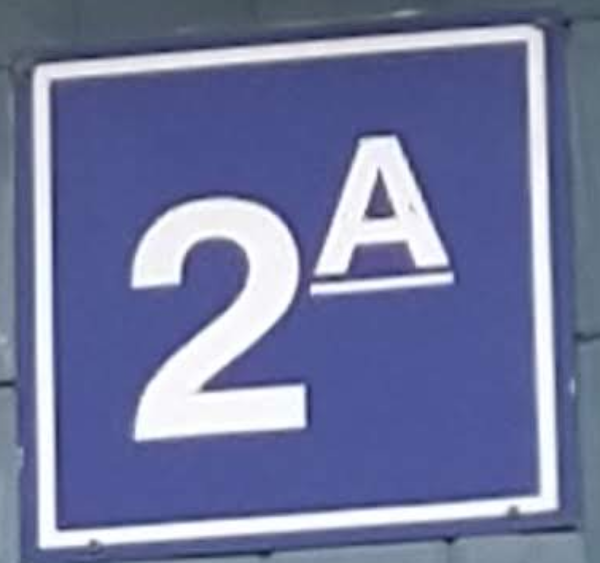

Для файла "ул ИСАЕВА 2А_1.png" результат распознавания:
ЕН



In [ ]:
ocr_table()